# **Data Collection**

In [ ]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install -q kagglehub

In [ ]:
from google.colab import files
import os
import kagglehub

# Step 1: Upload kaggle.json manually
print("📂 Please upload your kaggle.json file:")
uploaded = files.upload()

# Ensure the uploaded file exists
if "kaggle.json" not in uploaded:
    print("❌ kaggle.json upload failed. Please try again.")
else:
    # Step 2: Move the file to the correct location
    !mkdir -p /root/.config/kaggle
    !mv kaggle.json /root/.config/kaggle/

    # Step 3: Set proper permissions (read and write)
    !chmod 600 /root/.config/kaggle/kaggle.json

    # Step 4: Verify that the file exists
    if os.path.exists("/root/.config/kaggle/kaggle.json"):
        print("✅ kaggle.json uploaded and set up correctly!")
    else:
        print("❌ kaggle.json upload failed. Please check the file path.")

# Step 5: download dataset
try:
    dataset_path = kagglehub.dataset_download("evilspirit05/cocococo-dataset")
    print("✅ Dataset downloaded successfully!")
    print("📂 Path to dataset files:", dataset_path)

    # Step 7: Move dataset to /content/{dataset-name} for easier access
    target_path = os.path.join(os.getcwd(), "coco_dataset")
    !mkdir -p {target_path}  # Ensure target directory exists
    !cp -r {dataset_path}/* {target_path}/

    print(f"✅ Dataset moved to {target_path}")
    print("📂 Final Dataset contents:", os.listdir(target_path))

except Exception as e:
    print("❌ Error downloading dataset:", e)

📂 Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json
✅ kaggle.json uploaded and set up correctly!
✅ Dataset downloaded successfully!
📂 Path to dataset files: /kaggle/input/cocococo-dataset
✅ Dataset moved to /content/coco_dataset
📂 Final Dataset contents: ['export', 'README.roboflow.txt', 'README.dataset.txt']


In [ ]:
import os

base_path = '/content/coco_dataset'  # adjust if needed
export_dir = os.path.join(base_path, 'export')

non_image_files = []

# Walk through export folder
for root, dirs, files in os.walk(export_dir):
    for file in files:
        if not file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif', '.tiff')):
            relative_path = os.path.relpath(os.path.join(root, file), base_path)
            non_image_files.append(relative_path)

# Show all non-image files
if non_image_files:
    print("📄 Non-image files found in 'export':")
    for f in non_image_files:
        print(f"- {f}")
else:
    print("✅ No non-image files found in 'export'")


📄 Non-image files found in 'export':
- export/_annotations.coco.json


In [ ]:
import shutil

# Loop through non_image_files and move _annotations.coco.json
for file_path in non_image_files:
    filename = os.path.basename(file_path)
    if filename == '_annotations.coco.json':
        src_path = os.path.join(base_path, file_path)
        dest_path = os.path.join(base_path, filename)
        shutil.move(src_path, dest_path)
        print(f"✅ Moved {src_path} → {dest_path}")


✅ Moved /content/coco_dataset/export/_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


In [ ]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

verifing data

In [ ]:
# Count the number of files
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 29800


In [ ]:
import json

valid_extensions = {".jpg", ".jpeg", ".png", ".bmp"}

# Check if all files are images
non_image_files = [file for file in os.listdir(images_path)
                   if not any(file.lower().endswith(ext) for ext in valid_extensions)]

if non_image_files:
    print(f"Found non-image files: {non_image_files}")
else:
    print("All files are valid images!")


All files are valid images!


Deleting Unannotated images

In [ ]:
# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get all annotated image IDs
annotated_image_ids = {ann['image_id'] for ann in data['annotations']}

# Get all image file names
image_files = {img['file_name']: img['id'] for img in data['images']}

# Identify unannotated images
unannotated = [file for file, img_id in image_files.items() if img_id not in annotated_image_ids]

print(f"\nFound {len(unannotated)} unannotated images.")

# Delete unannotated images
for file in unannotated:
    try:
        file_path = os.path.join(images_path, file)
        os.remove(file_path)
        print(f"Deleted unannotated image: {file}")
    except FileNotFoundError:
        print(f"File not found: {file}")

print("\nDeletion complete!")


Found 3500 unannotated images.
Deleted unannotated image: 1478895384169910818_jpg.rf.684000e1e8f68a2e723485d1d649abb6.jpg
Deleted unannotated image: 1478897734455141074_jpg.rf.686509e5a56a940593a1e56d9ead181e.jpg
Deleted unannotated image: 1478897676755018566_jpg.rf.68749568ca05e6b2b439da2b72d89f85.jpg
Deleted unannotated image: 1478898164636421519_jpg.rf.68c90be17d46a29254f211e200de142b.jpg
Deleted unannotated image: 1478898165208043913_jpg.rf.68f3924e2d2a0796c4373829484f3c54.jpg
Deleted unannotated image: 1478895940606118436_jpg.rf.68xNq7HL27EKmRnrGgpz.jpg
Deleted unannotated image: 1478895984023324459_jpg.rf.691058100352b5ffb50a8eedb5f95f1a.jpg
Deleted unannotated image: 1478896046293760222_jpg.rf.692464726c52b3e2ff622b214ac91978.jpg
Deleted unannotated image: 1478896142270652043_jpg.rf.692d6caddfd1fda42650b775879d4be0.jpg
Deleted unannotated image: 1478901062218872908_jpg.rf.6945df45ba4ddc24f3c58b3d953279b6.jpg
Deleted unannotated image: 1478895838344289010_jpg.rf.6971448a94c306f7

In [ ]:
# check after deleting unannotated
file_count = len([file for file in os.listdir(images_path) if os.path.isfile(os.path.join(images_path, file))])

print(f"Number of files in '{images_path}': {file_count}")

Number of files in '/content/coco_dataset/export': 26300


modify json file after deleting unannotated

In [ ]:
import json
import os

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Get list of existing images in the directory
existing_images = set(os.listdir(images_path))

# Filter the images list to include only existing files
filtered_images = [img for img in data['images'] if img['file_name'] in existing_images]

# Get the valid image IDs after filtering
valid_image_ids = {img['id'] for img in filtered_images}

# Filter annotations to keep only those belonging to valid images
filtered_annotations = [ann for ann in data['annotations'] if ann['image_id'] in valid_image_ids]

# Update the data dictionary
data['images'] = filtered_images
data['annotations'] = filtered_annotations

# Save the updated JSON file
updated_file = "updated_annotations.coco.json"
with open(updated_file, "w") as outfile:
    json.dump(data, outfile)

print(f"✅ Updated annotation file saved as {updated_file}")

✅ Updated annotation file saved as updated_annotations.coco.json


In [ ]:
import os
import shutil

# Define paths
source_file = '/content/updated_annotations.coco.json'  # Current location
destination_dir = '/content/coco_dataset'  # Target directory
destination_file = os.path.join(destination_dir, '_annotations.coco.json')  # New path

# Check if source exists
if not os.path.exists(source_file):
    raise FileNotFoundError(f"Source file not found: {source_file}")

# Ensure destination directory exists
os.makedirs(destination_dir, exist_ok=True)

# Move the file (will overwrite if exists)
shutil.move(source_file, destination_file)

print(f"Successfully moved:\n{source_file} → {destination_file}")

Successfully moved:
/content/updated_annotations.coco.json → /content/coco_dataset/_annotations.coco.json


**paths after deleting unannotated images and modifing json**

In [ ]:
images_path = "/content/coco_dataset/export"
json_path = "/content/coco_dataset/_annotations.coco.json"

In [ ]:
# double check
from collections import defaultdict

with open(json_path, 'r') as f:
    coco_data = json.load(f)

images = coco_data['images']
annotations = coco_data['annotations']

# Map image_id to number of annotations
image_id_to_ann_count = defaultdict(int)
for ann in annotations:
    image_id_to_ann_count[ann['image_id']] += 1

# Check for unannotated images
annotated = []
unannotated = []

for img in images:
    if image_id_to_ann_count[img['id']] > 0:
        annotated.append(img)
    else:
        unannotated.append(img)

print(f"✅ Annotated images: {len(annotated)}")
print(f"❌ Unannotated images: {len(unannotated)}")

✅ Annotated images: 26300
❌ Unannotated images: 0


**EDA**

display classes

In [ ]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print basic structure
print("Keys:", data.keys())

# Print a few image entries
print("\nSample Image Entry:")
for image in data["images"][:3]:  # Adjust the number as needed
    print(image)

# Print a few annotation entries
print("\nSample Annotation Entry:")
for annotation in data["annotations"][:3]:
    print(annotation)

# Print category names
print("\nCategories:")
for category in data["categories"]:
    print(category)

Keys: dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

Sample Image Entry:
{'id': 0, 'license': 1, 'file_name': '1478897026627294725_jpg.rf.6828a4e821cbab4c2c277d74df291f00.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 2, 'license': 1, 'file_name': '1478900859981702684_jpg.rf.6830635c7d9197475638f0818f5dd103.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}
{'id': 3, 'license': 1, 'file_name': '1478899989907374870_jpg.rf.684aa8281432f9513dad8d91c54a1346.jpg', 'height': 512, 'width': 512, 'date_captured': '2021-06-09T12:24:25+00:00'}

Sample Annotation Entry:
{'id': 0, 'image_id': 0, 'category_id': 2, 'bbox': [140, 262, 21, 25.5], 'area': 535.5, 'segmentation': [], 'iscrowd': 0}
{'id': 1, 'image_id': 0, 'category_id': 2, 'bbox': [266, 231, 24, 95.5], 'area': 2292, 'segmentation': [], 'iscrowd': 0}
{'id': 2, 'image_id': 0, 'category_id': 2, 'bbox': [271, 241, 17, 76], 'area': 1292, 'segmentati

In [ ]:
import json

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

# Print all class names
print("Classes:")
for category in data["categories"]:
    print(f"ID: {category['id']}: {category['name']}")

Classes:
ID: 0: obstacles
ID: 1: biker
ID: 2: car
ID: 3: pedestrian
ID: 4: trafficLight
ID: 5: trafficLight-Green
ID: 6: trafficLight-GreenLeft
ID: 7: trafficLight-Red
ID: 8: trafficLight-RedLeft
ID: 9: trafficLight-Yellow
ID: 10: trafficLight-YellowLeft
ID: 11: truck


In [ ]:
sample_image = data['images'][0]
print(json.dumps(sample_image, indent=2))


{
  "id": 0,
  "license": 1,
  "file_name": "1478897026627294725_jpg.rf.6828a4e821cbab4c2c277d74df291f00.jpg",
  "height": 512,
  "width": 512,
  "date_captured": "2021-06-09T12:24:25+00:00"
}


In [ ]:
import json

# Load COCO annotations
json_path = "/content/coco_dataset/_annotations.coco.json"
with open(json_path, 'r') as f:
    coco_data = json.load(f)

# Count number of annotations (each corresponds to a bounding box/object)
category_ids = set(ann['category_id'] for ann in coco_data['annotations'])
print(len(category_ids))  # Number of unique object types used

11


In [ ]:
import json

json_path = "/content/coco_dataset/_annotations.coco.json"
# Load COCO annotations
with open(json_path, 'r') as f:
    coco_data = json.load(f)
annotations = coco_data['annotations']
print("\nSample bounding boxes (in COCO format [x_min, y_min, width, height]):")
for i, ann in enumerate(annotations[:5]):
    print(f"{i+1}: {ann['bbox']}")

Number of bounding boxes: 194539

Sample bounding boxes (in COCO format [x_min, y_min, width, height]):
1: [140, 262, 21, 25.5]
2: [266, 231, 24, 95.5]
3: [271, 241, 17, 76]
4: [280, 220, 89.5, 121]
5: [291, 247, 79, 83.5]


In [ ]:
from collections import Counter
from PIL import Image
import matplotlib.pyplot as plt

# Load the COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

 Class Distribution

🔍 Analyzing Class Distribution...


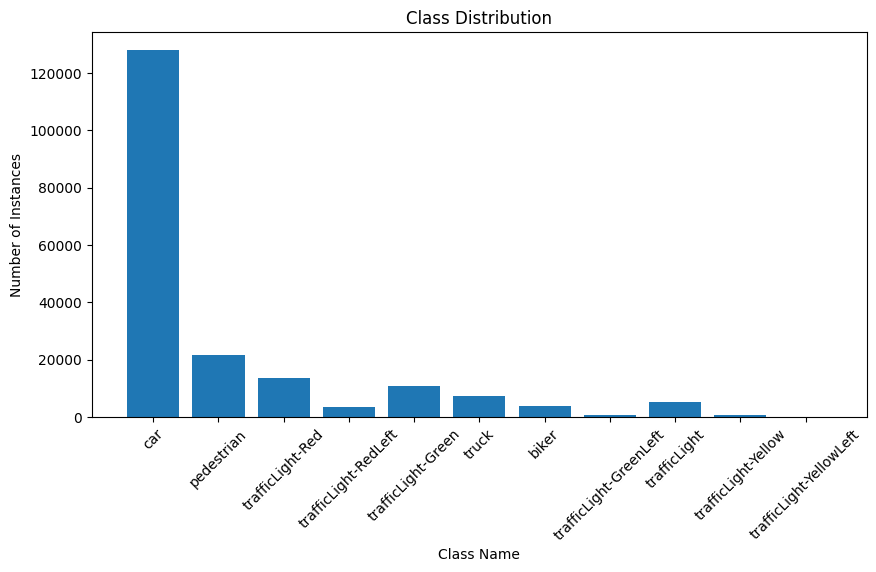

In [ ]:
print("🔍 Analyzing Class Distribution...")
class_counts = Counter(ann['category_id'] for ann in data['annotations'])

# Map category IDs to names
class_names = {cat['id']: cat['name'] for cat in data['categories']}

# Plot the class distribution
plt.figure(figsize=(10, 5))
plt.bar([class_names[cid] for cid in class_counts.keys()], class_counts.values())
plt.title("Class Distribution")
plt.xlabel("Class Name")
plt.ylabel("Number of Instances")
plt.xticks(rotation=45)
plt.show()


size checker

In [ ]:
# Image Dimension Analysis
print("\n📏 Analyzing Image Dimensions...")
dimensions = []
for img in data['images']:
    dimensions.append((img['width'], img['height']))

# Display common dimensions
dim_counts = Counter(dimensions)
print("Most common dimensions:")
for dim, count in dim_counts.most_common(5):
    print(f"Dimensions: {dim}, Count: {count}")


📏 Analyzing Image Dimensions...
Most common dimensions:
Dimensions: (512, 512), Count: 26300


Quality Checker

In [ ]:
print("\n Image Quality checking")
low_quality = [img for img in data['images'] if img['width'] < 300 or img['height'] < 300]
print(f"Number of low-quality images (resolution < 300x300): {len(low_quality)}")
if low_quality:
    print("Sample low-quality images:", [img['file_name'] for img in low_quality[:5]])


 Image Quality checking
Number of low-quality images (resolution < 300x300): 0


In [ ]:
pip install opencv-python scikit-image matplotlib

Analyzing images: 100%|██████████| 200/200 [00:03<00:00, 60.26it/s]


Average blur (variance of Laplacian): 936.91
Average estimated noise: 0.5832


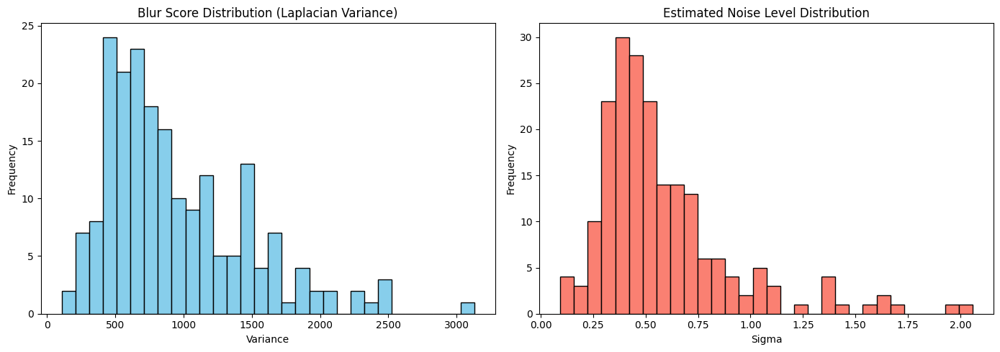

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.restoration import estimate_sigma
import random
from tqdm import tqdm

# ---------- CONFIG ----------
images_path = "/content/coco_dataset/export"
sample_size = 200  # Number of images to analyze
random.seed(42)

# ---------- FUNCTIONS ----------

def calculate_blur(image):
    """Calculate blur using the variance of Laplacian."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def estimate_noise(image):
    """Estimate noise standard deviation using skimage."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    sigma_est = estimate_sigma(gray, channel_axis=None, average_sigmas=True)
    return sigma_est

def batch_analyze_images(folder_path, sample_size=100):
    all_images = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.png'))]
    selected_images = random.sample(all_images, min(sample_size, len(all_images)))

    blur_scores = []
    noise_levels = []

    for filename in tqdm(selected_images, desc="Analyzing images"):
        try:
            img_path = os.path.join(folder_path, filename)
            img = cv2.imread(img_path)
            if img is None:
                continue

            blur = calculate_blur(img)
            noise = estimate_noise(img)

            blur_scores.append(blur)
            noise_levels.append(noise)
        except Exception as e:
            print(f"Error processing {filename}: {e}")

    return blur_scores, noise_levels

def plot_distributions(blur_scores, noise_levels):
    """Plot blur and noise distributions."""
    plt.figure(figsize=(14, 5))

    # Blur distribution
    plt.subplot(1, 2, 1)
    plt.hist(blur_scores, bins=30, color='skyblue', edgecolor='black')
    plt.title('Blur Score Distribution (Laplacian Variance)')
    plt.xlabel('Variance')
    plt.ylabel('Frequency')

    # Noise distribution
    plt.subplot(1, 2, 2)
    plt.hist(noise_levels, bins=30, color='salmon', edgecolor='black')
    plt.title('Estimated Noise Level Distribution')
    plt.xlabel('Sigma')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# ---------- EXECUTION ----------

blur_scores, noise_levels = batch_analyze_images(images_path, sample_size=sample_size)

print(f"Average blur (variance of Laplacian): {np.mean(blur_scores):.2f}")
print(f"Average estimated noise: {np.mean(noise_levels):.4f}")

plot_distributions(blur_scores, noise_levels)


more visualizations

In [ ]:
import random
import matplotlib.pyplot as plt
import cv2
from PIL import Image, ImageDraw
import pandas as pd
import numpy as np
import seaborn as sns
from IPython.display import display

# Display settings for better visuals
sns.set(style="whitegrid")
plt.rcParams.update({'font.size': 14})

# Load the updated COCO annotation file
with open(json_path, "r") as file:
    data = json.load(file)

In [ ]:
# Helper function to plot images with bounding boxes
def plot_image_with_boxes(image_path, annotations):
    image = Image.open(image_path)
    draw = ImageDraw.Draw(image)

    for ann in annotations:
        bbox = ann['bbox']
        x, y, width, height = bbox
        x2, y2 = x + width, y + height
        label = class_names[ann['category_id']]
        # Draw bounding box
        draw.rectangle([x, y, x2, y2], outline="red", width=3)
        # Draw label with larger font size
        draw.text((x, y), label, fill="yellow", font=None, anchor=None, size=24)
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.show()


🖼️ Showing Random Samples with Bounding Boxes
Image: 1478900957671553561_jpg.rf.GZVdKZdkyUXLyD18XyCm.jpg


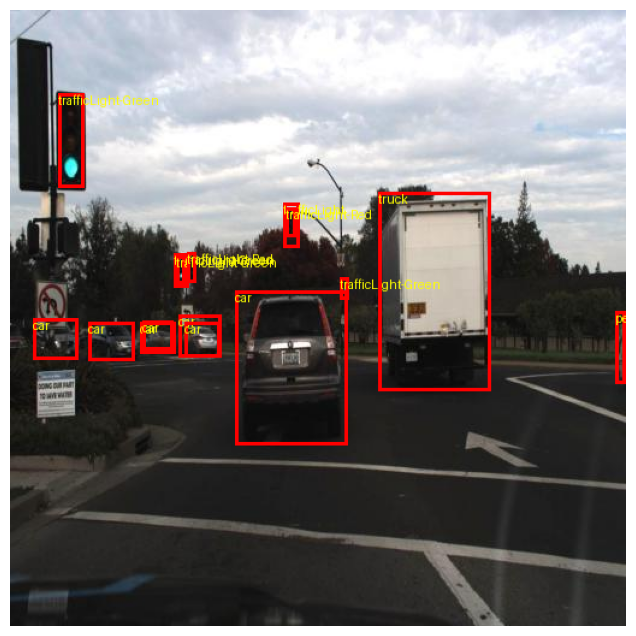

Image: 1478898098938399867_jpg.rf.o28rtqTW1Yc1p2Y9s66X.jpg


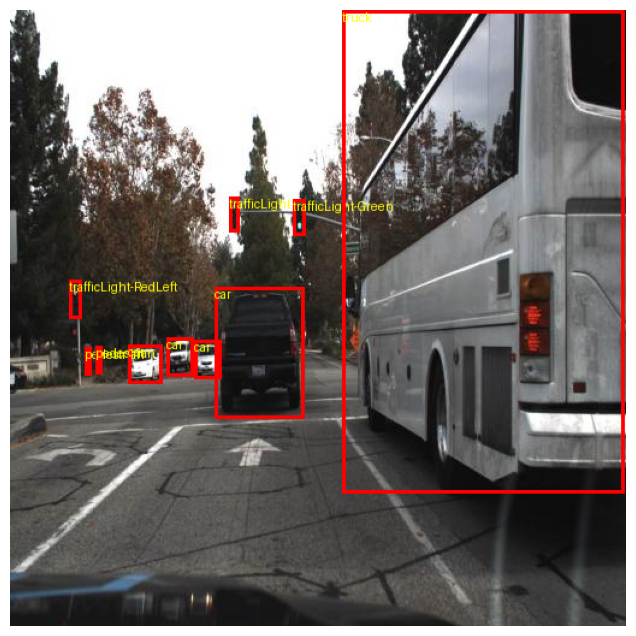

Image: 1478898890174690383_jpg.rf.JGodtNDvtFXJdeRJXbaR.jpg


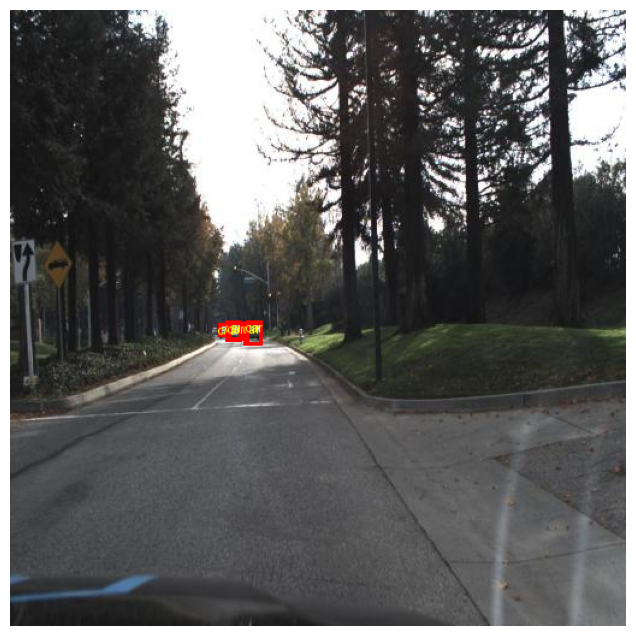

In [ ]:
print("\n🖼️ Showing Random Samples with Bounding Boxes")
sample_images = random.sample(data['images'], 3)  # Display 3 random images
for img in sample_images:
    image_path = os.path.join(images_path, img['file_name'])
    annotations = [ann for ann in data['annotations'] if ann['image_id'] == img['id']]
    print(f"Image: {img['file_name']}")
    plot_image_with_boxes(image_path, annotations)

Bounding Boxes Analysis


 Analyzing Bounding Boxes


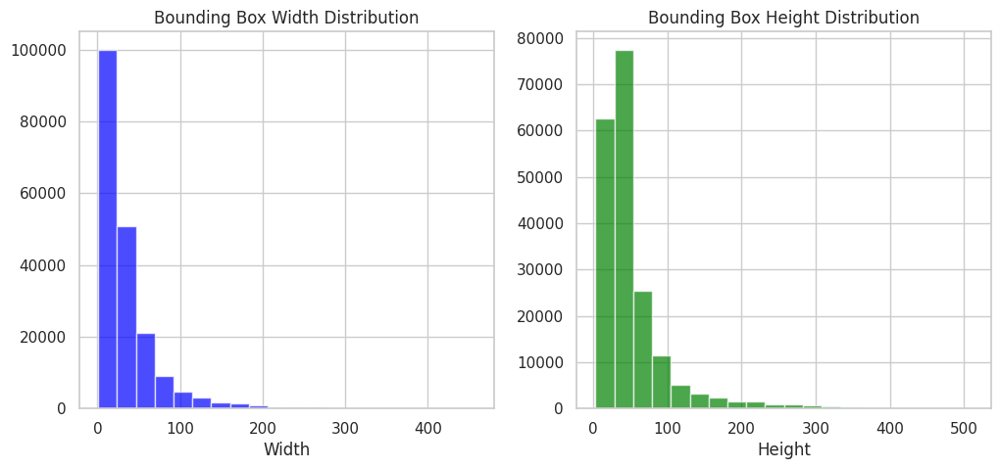

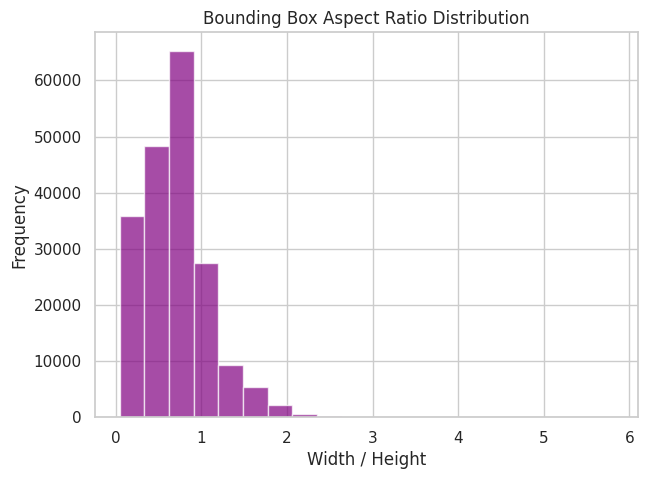

In [ ]:
print("\n Analyzing Bounding Boxes")
bbox_dims = [(ann['bbox'][2], ann['bbox'][3]) for ann in data['annotations']]
bbox_widths, bbox_heights = zip(*bbox_dims)

# Plot bounding box width and height distributions
plt.figure(figsize=(12, 5))

# Width Distribution
plt.subplot(1, 2, 1)
plt.hist(bbox_widths, bins=20, color='blue', alpha=0.7)
plt.title("Bounding Box Width Distribution")
plt.xlabel("Width")

# Height Distribution
plt.subplot(1, 2, 2)
plt.hist(bbox_heights, bins=20, color='green', alpha=0.7)
plt.title("Bounding Box Height Distribution")
plt.xlabel("Height")
plt.show()

# Aspect Ratio Analysis
aspect_ratios = [w / h for w, h in bbox_dims]
plt.figure(figsize=(7, 5))
plt.hist(aspect_ratios, bins=20, color='purple', alpha=0.7)
plt.title("Bounding Box Aspect Ratio Distribution")
plt.xlabel("Width / Height")
plt.ylabel("Frequency")
plt.show()

In [ ]:
import json

# Path to your COCO JSON file
json_path = "/content/coco_dataset/_annotations.coco.json"

# Load JSON annotations
with open(json_path, 'r') as f:
    coco_data = json.load(f)

# 'annotations' field contains all bounding boxes
total_bboxes = len(coco_data['annotations'])

print(f"✅ Total number of bounding boxes in the dataset: {total_bboxes}")


✅ Total number of bounding boxes in the dataset: 194539


Spatial Distribution Analysis

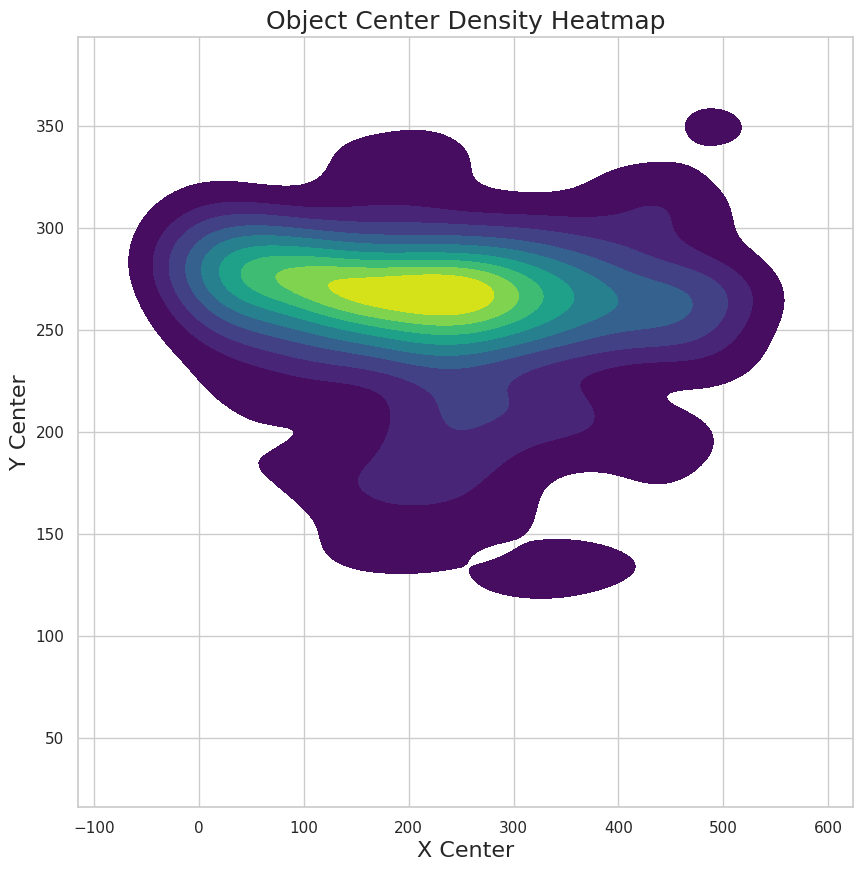

<ipython-input-26-fd36e0cfaa90>:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='class', y='width', palette='Set2')


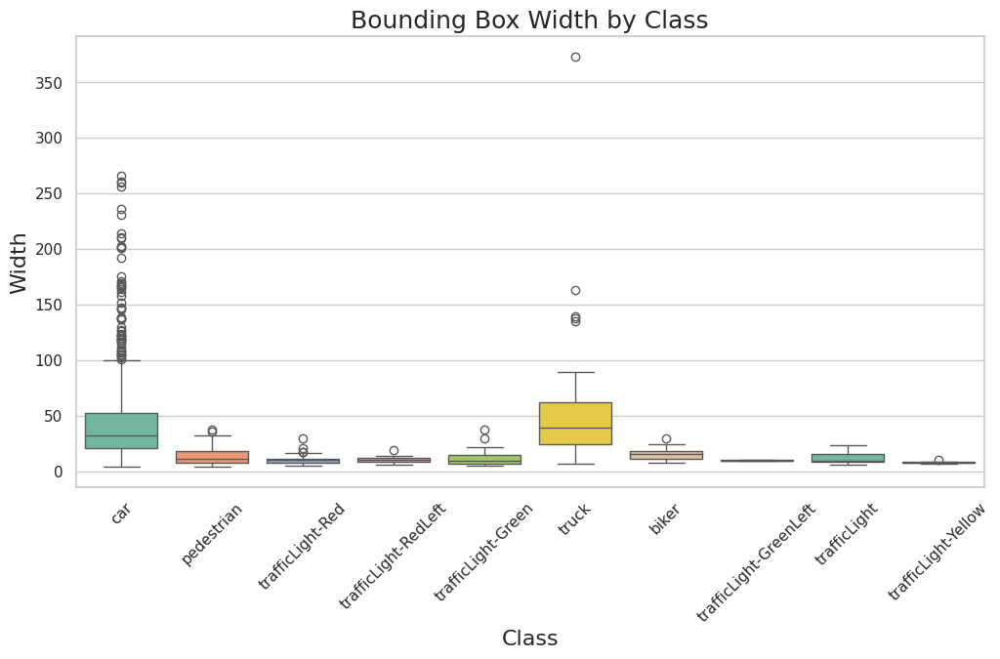

In [ ]:
def analyze_spatial_distribution(json_path=json_path, sample_size=1000):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return None

    # Prepare data
    spatial_data = []
    for ann in data['annotations'][:sample_size]:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            x, y, w, h = ann['bbox']
            spatial_data.append({
                'class': cat_name,
                'x_center': x + w / 2,
                'y_center': y + h / 2,
                'width': w,
                'height': h
            })
        except StopIteration:
            print(f"⚠️ Category ID {ann['category_id']} not found in categories")
            continue

    df = pd.DataFrame(spatial_data)
    if df.empty:
        print("❌ No valid annotations found.")
        return None

    # Spatial heatmap
    plt.figure(figsize=(10, 10))
    sns.kdeplot(data=df, x='x_center', y='y_center', fill=True, cmap='viridis')
    plt.title('Object Center Density Heatmap', fontsize=18)
    plt.xlabel('X Center', fontsize=16)
    plt.ylabel('Y Center', fontsize=16)
    plt.show()

    # Size distribution
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df, x='class', y='width', palette='Set2')
    plt.title('Bounding Box Width by Class', fontsize=18)
    plt.xlabel('Class', fontsize=16)
    plt.ylabel('Width', fontsize=16)
    plt.xticks(rotation=45)
    plt.show()

    return df

# Run the analysis on the entire dataset
spatial_df = analyze_spatial_distribution()


Advanced Statistics Calculation

In [ ]:
def get_advanced_stats(data):
    class_counts = defaultdict(int)
    size_data = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] += 1

            # Bounding box size
            width = ann['bbox'][2]
            height = ann['bbox'][3]
            size_data[cat_name].append(width * height)
        except StopIteration:
            continue

    # Create DataFrame - ensure numerical values
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'avg_size': [np.mean(size_data[c]) if size_data[c] else 0 for c in class_counts]
    }).sort_values('count', ascending=False)

    # Convert avg_size to float explicitly
    df['avg_size'] = df['avg_size'].astype(float)

    # Display with gradient coloring
    return df.style.background_gradient(cmap='Blues', subset=['count', 'avg_size']).format({
        'count': "{:d}",
        'avg_size': "{:.2f}"
    })

# Load the entire data
with open(json_path) as f:
    data = json.load(f)

# Display advanced statistics for the entire dataset
advanced_stats = get_advanced_stats(data)
display(advanced_stats)

,class,count,avg_size
0,car,127873,4087.01
1,pedestrian,21491,1426.20
2,trafficLight-Red,13673,396.76
4,trafficLight-Green,10838,308.70
5,truck,7194,8258.77
8,trafficLight,5101,630.62
6,biker,3704,1567.55
3,trafficLight-RedLeft,3482,308.63
7,trafficLight-GreenLeft,614,330.29
9,trafficLight-Yellow,541,347.25


Bias Detection and Visualization



🔍 Class Representation:


,class,count,percentage,avg_size
0,car,127873,65.731293,4087.007779
1,pedestrian,21491,11.047142,1426.195942
2,trafficLight-Red,13673,7.028411,396.755713
4,trafficLight-Green,10838,5.571119,308.702008
5,truck,7194,3.697973,8258.766767
8,trafficLight,5101,2.622096,630.617981
6,biker,3704,1.903988,1567.550964
3,trafficLight-RedLeft,3482,1.789872,308.634486
7,trafficLight-GreenLeft,614,0.315618,330.293338
9,trafficLight-Yellow,541,0.278093,347.246753


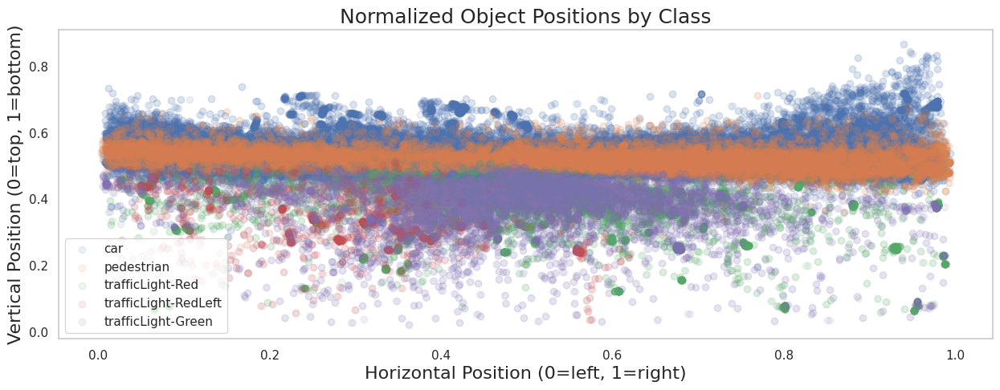

In [ ]:
def detect_biases(json_path=json_path):
    try:
        with open(json_path) as f:
            data = json.load(f)
    except FileNotFoundError:
        print(f"❌ Annotation file not found at {json_path}")
        return

    # Class distribution
    class_counts = {}
    size_dist = defaultdict(list)
    pos_dist = defaultdict(list)

    for ann in data['annotations']:
        try:
            cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
            class_counts[cat_name] = class_counts.get(cat_name, 0) + 1

            # Size distribution
            area = ann['bbox'][2] * ann['bbox'][3]
            size_dist[cat_name].append(area)

            # Position distribution
            img = next(i for i in data['images'] if i['id'] == ann['image_id'])
            x_center = (ann['bbox'][0] + ann['bbox'][2] / 2) / img['width']
            y_center = (ann['bbox'][1] + ann['bbox'][3] / 2) / img['height']
            pos_dist[cat_name].append((x_center, y_center))
        except StopIteration:
            continue

    # Class imbalance analysis
    df = pd.DataFrame({
        'class': list(class_counts.keys()),
        'count': list(class_counts.values()),
        'percentage': [100 * c / sum(class_counts.values()) for c in class_counts.values()],
        'avg_size': [np.mean(size_dist[k]) for k in class_counts]
    }).sort_values('count', ascending=False)

    print("\n🔍 Class Representation:")
    display(df.style.background_gradient(subset=['count', 'percentage'], cmap='YlOrRd'))

    # Positional bias visualization
    plt.figure(figsize=(15, 5))
    for i, (cls, positions) in enumerate(pos_dist.items()):
        if i >= 5: break  # Top 5 classes for clarity
        x, y = zip(*positions)
        plt.scatter(x, y, alpha=0.1, label=cls)

    plt.title('Normalized Object Positions by Class', fontsize=18)
    plt.xlabel('Horizontal Position (0=left, 1=right)', fontsize=16)
    plt.ylabel('Vertical Position (0=top, 1=bottom)', fontsize=16)
    plt.legend()
    plt.grid()
    plt.show()

# Run bias detection for the entire dataset
detect_biases()

Quality Metrics Analysis

In [ ]:
def advanced_quality_metrics(json_path=json_path):

    try:
        # Load annotations with error handling
        with open(json_path) as f:
            data = json.load(f)
    except Exception as e:
        print(f"❌ Error loading annotations: {e}")
        return

    metrics = {
        'images_with_small_objects': 0,
        'images_with_crowding': 0,
        'class_cooccurrence': defaultdict(int),
        'total_images_processed': 0
    }

    # Analyze images
    sample_images = data['images'][:min(1000, len(data['images']))]
    if not sample_images:
        print("❌ No images found in annotations")
        return

    for img in sample_images:
        metrics['total_images_processed'] += 1
        img_annots = [a for a in data['annotations'] if a['image_id'] == img['id']]
        if not img_annots:
            continue

        # Small objects check
        small_objs = sum((a['bbox'][2] * a['bbox'][3] < 32 * 32) for a in img_annots)
        if small_objs > 0:
            metrics['images_with_small_objects'] += 1

        # Crowding check
        if len(img_annots) > 10:
            metrics['images_with_crowding'] += 1

        # Class co-occurrence
        classes = {a['category_id'] for a in img_annots}
        if len(classes) > 1:
            for cls in classes:
                metrics['class_cooccurrence'][cls] += 1

    # Print the quality report
    print(f"\n🔍 Quality Report for the Entire Dataset:")
    print(f"Images processed: {metrics['total_images_processed']}")
    if metrics['total_images_processed'] > 0:
        print(f"- Images with small objects: {100 * metrics['images_with_small_objects'] / metrics['total_images_processed']:.1f}%")
        print(f"- Crowded images: {100 * metrics['images_with_crowding'] / metrics['total_images_processed']:.1f}%")
    else:
        print("❌ No valid images with annotations found")

    # Co-occurrence analysis
    if metrics['class_cooccurrence']:
        cooccur_data = []
        for cls, count in metrics['class_cooccurrence'].items():
            try:
                cat_name = next(c['name'] for c in data['categories'] if c['id'] == cls)
                cooccur_data.append((cat_name, count))
            except StopIteration:
                continue
        cooccur_df = pd.DataFrame(cooccur_data, columns=['Class', 'Co-occurrence Count']).sort_values('Co-occurrence Count', ascending=False)
        print("\n📊 Most Common Co-occurring Classes:")
        display(cooccur_df.head(10))
    else:
        print("❌ No multi-class images found in the sample")


advanced_quality_metrics()



🔍 Quality Report for the Entire Dataset:
Images processed: 1000
- Images with small objects: 90.5%
- Crowded images: 22.0%

📊 Most Common Co-occurring Classes:


,Class,Co-occurrence Count
0,car,569
1,pedestrian,262
2,trafficLight-Red,197
4,truck,177
5,trafficLight-Green,128
8,trafficLight,102
6,biker,88
3,trafficLight-RedLeft,86
7,trafficLight-GreenLeft,12
9,trafficLight-Yellow,8


REPORT

In [ ]:
# 1: Analyze Entire Dataset

def analyze_entire_dataset(base_path='/content/coco_dataset'):
    print(f"\n{'='*40}\n ANALYZING ENTIRE DATASET \n{'='*40}")

    # 1. Resolution Analysis
    print("\n RESOLUTION ANALYSIS")
    analyze_resolution(base_path)

    # 2. Class Distribution
    print("\n CLASS DISTRIBUTION")
    class_stats = analyze_class_distribution(base_path)

    # 3. Spatial Bias
    print("\n SPATIAL DISTRIBUTION")
    analyze_spatial_distribution(base_path)

    # 4. Advanced Metrics
    print("\n ADVANCED METRICS")
    advanced_quality_metrics(base_path)

In [ ]:
# 2: Resolution Analysis

def analyze_resolution(base_path):
    img_dir = images_path
    resolutions = []

    for img_file in os.listdir(img_dir)[:1000]:  # Sample
        with Image.open(os.path.join(img_dir, img_file)) as img:
            resolutions.append(img.size)

    resolutions = np.array(resolutions)

    stats = pd.DataFrame({
        'Average Width': [int(resolutions[:,0].mean())],
        'Average Height': [int(resolutions[:,1].mean())],
        'Min Width': [resolutions[:,0].min()],
        'Max Width': [resolutions[:,0].max()],
        'Aspect Ratio STD': [np.std(resolutions[:,0]/resolutions[:,1])]
    })
    display(stats.style.background_gradient(cmap='Blues'))


In [ ]:
# 3: Class Distribution Analysis

def analyze_class_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    class_counts = defaultdict(int)
    for ann in data['annotations']:
        cat_name = next(c['name'] for c in data['categories'] if c['id'] == ann['category_id'])
        class_counts[cat_name] += 1

    df = pd.DataFrame({
        'Class': list(class_counts.keys()),
        'Count': list(class_counts.values()),
        '% of Total': [100 * x / sum(class_counts.values()) for x in class_counts.values()]
    }).sort_values('Count', ascending=False)

    display(df.style.background_gradient(subset=['Count'], cmap='YlOrRd'))
    return df


In [ ]:
# 4: Spatial Distribution Analysis

def analyze_spatial_distribution(base_path):
    with open(os.path.join(json_path)) as f:
        data = json.load(f)

    positions = []
    for ann in data['annotations'][:2000]:  # Sample
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])
        x = (ann['bbox'][0] + ann['bbox'][2]/2) / img['width']
        y = (ann['bbox'][1] + ann['bbox'][3]/2) / img['height']
        positions.append([x, y])

    positions = np.array(positions)
    plt.figure(figsize=(10,5))
    plt.hist2d(positions[:,0], positions[:,1], bins=50, cmap='hot')
    plt.colorbar()
    plt.title('Object Position Heatmap (Normalized Coordinates)')
    plt.xlabel('Horizontal Position (0=left, 1=right)')
    plt.ylabel('Vertical Position (0=top, 1=bottom)')
    plt.show()


In [ ]:
# 5: Advanced Metrics Analysis

def advanced_quality_metrics(base_path):
    with open(json_path) as f:
        data = json.load(f)

    metrics = {
        'Small Objects (<32px)': 0,
        'Oversized Objects': 0,
        'Edge Cases': 0
    }

    for ann in data['annotations'][:5000]:  # Sample
        area = ann['bbox'][2] * ann['bbox'][3]
        img = next(i for i in data['images'] if i['id'] == ann['image_id'])

        # Small objects
        if area < 32*32:
            metrics['Small Objects (<32px)'] += 1

        # Edge cases
        x1, y1 = ann['bbox'][0], ann['bbox'][1]
        x2, y2 = x1 + ann['bbox'][2], y1 + ann['bbox'][3]
        if (x1 <= 2 or y1 <= 2 or x2 >= img['width']-2 or y2 >= img['height']-2):
            metrics['Edge Cases'] += 1

    total = len(data['annotations'][:5000])
    for k in metrics:
        metrics[k] = f"{100 * metrics[k] / total:.1f}%"

    display(pd.DataFrame([metrics]))


 ANALYZING ENTIRE DATASET 

 RESOLUTION ANALYSIS


,Average Width,Average Height,Min Width,Max Width,Aspect Ratio STD
0,512,512,512,512,0.000000



 CLASS DISTRIBUTION


,Class,Count,% of Total
0,car,127873,65.731293
1,pedestrian,21491,11.047142
2,trafficLight-Red,13673,7.028411
4,trafficLight-Green,10838,5.571119
5,truck,7194,3.697973
8,trafficLight,5101,2.622096
6,biker,3704,1.903988
3,trafficLight-RedLeft,3482,1.789872
7,trafficLight-GreenLeft,614,0.315618
9,trafficLight-Yellow,541,0.278093



 SPATIAL DISTRIBUTION


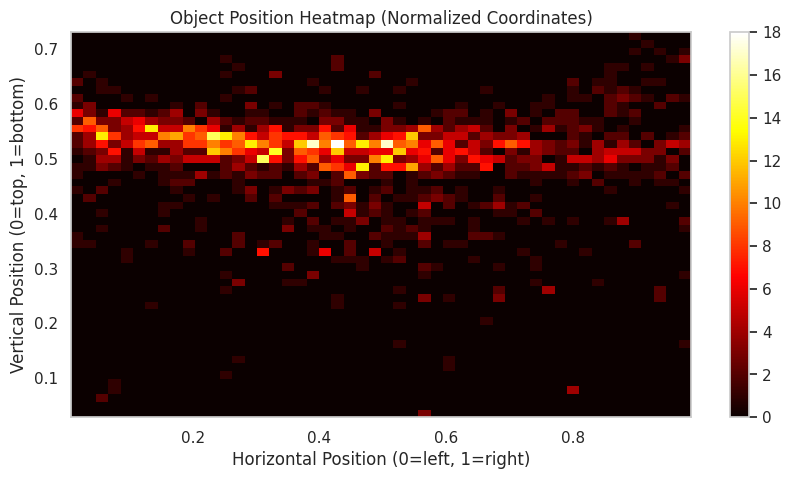


 ADVANCED METRICS


,Small Objects (<32px),Oversized Objects,Edge Cases
0,57.7%,0.0%,8.1%


In [ ]:
#Run Full Dataset Analysis
analyze_entire_dataset()

will do later after splitting if needed

# **Creating a subset for training**

In [ ]:
import json
import random
import shutil
import os
from collections import Counter, defaultdict

from tqdm import tqdm

# --- CONFIG ---
subset_size = 5000
min_class_ratio = 0.02   # each class must have at least 2% of subset
max_class_ratio = 0.50   # no class should exceed 25% of subset
max_attempts = 10         # how many times to retry sampling
random.seed(42)

# --- Paths ---
coco_json_path = 'coco_dataset/_annotations.coco.json'
subset_dir = 'coco_dataset/subset_balanced'
os.makedirs(subset_dir, exist_ok=True)

# --- Load COCO ---
with open(coco_json_path) as f:
    coco = json.load(f)

all_images = coco['images']
all_annotations = coco['annotations']
categories = coco['categories']
cat_id_to_name = {cat['id']: cat['name'] for cat in categories}

# --- Build image_id → annotations map ---
image_to_anns = defaultdict(list)
for ann in all_annotations:
    image_to_anns[ann['image_id']].append(ann)

# --- Build class_id → image_ids map ---
class_to_images = defaultdict(set)
for ann in all_annotations:
    class_to_images[ann['category_id']].add(ann['image_id'])

# --- Calculate min/max per class in subset ---
min_per_class = int(min_class_ratio * subset_size)
max_per_class = int(max_class_ratio * subset_size)

# --- Sampling ---
selected_image_ids = set()
class_instance_counter = Counter()

attempts = 0
while len(selected_image_ids) < subset_size and attempts < max_attempts:
    random.shuffle(all_images)
    for img in tqdm(all_images):
        if len(selected_image_ids) >= subset_size:
            break
        img_id = img['id']
        if img_id in selected_image_ids:
            continue
        anns = image_to_anns.get(img_id, [])
        if not anns:
            continue
        class_ids_in_image = {ann['category_id'] for ann in anns}

        # Check if adding this image breaks class limits
        will_exceed = False
        for cid in class_ids_in_image:
            if class_instance_counter[cid] >= max_per_class:
                will_exceed = True
                break
        if will_exceed:
            continue

        # Add image and update counts
        selected_image_ids.add(img_id)
        for cid in class_ids_in_image:
            class_instance_counter[cid] += 1
    attempts += 1

# --- Finalize ---
subset_images = [img for img in all_images if img['id'] in selected_image_ids]
subset_annotations = [ann for ann in all_annotations if ann['image_id'] in selected_image_ids]

# Save balanced subset JSON
subset_json = {
    'info': coco['info'],
    'licenses': coco['licenses'],
    'categories': coco['categories'],
    'images': subset_images,
    'annotations': subset_annotations
}

with open(f'{subset_dir}/annotations.coco.json', 'w') as f:
    json.dump(subset_json, f)

# Copy images
print("📁 Copying images...")
for img in subset_images:
    src_path = f"coco_dataset/export/{img['file_name']}"
    dst_path = f"{subset_dir}/{img['file_name']}"
    if os.path.exists(src_path):
        shutil.copy(src_path, dst_path)

print(f"✅ Balanced subset created with {len(subset_images)} images.")


100%|██████████| 26300/26300 [00:00<00:00, 360271.85it/s]


📁 Copying images...
✅ Balanced subset created with 3052 images.


In [ ]:
import json
import random
import shutil
import os

# Paths
coco_json_path = 'coco_dataset/_annotations.coco.json'
subset_dir = 'coco_dataset/subset'
os.makedirs(subset_dir, exist_ok=True)

# Load original JSON
with open(coco_json_path) as f:
    coco = json.load(f)

# Subset size (e.g., 200 images)
subset_size = 3000
all_images = coco['images']
subset_images = random.sample(all_images, subset_size)
subset_image_ids = {img['id'] for img in subset_images}

# Filter annotations
subset_annotations = [ann for ann in coco['annotations'] if ann['image_id'] in subset_image_ids]

# Create new subset JSON
subset_json = {
    'info': coco['info'],
    'licenses': coco['licenses'],
    'categories': coco['categories'],
    'images': subset_images,
    'annotations': subset_annotations
}

# Save subset JSON
with open(f'{subset_dir}/annotations.coco.json', 'w') as f:
    json.dump(subset_json, f)

# Copy images to subset folder
for img in subset_images:
    shutil.copy(f"coco_dataset/export/{img['file_name']}", f"{subset_dir}/{img['file_name']}")


In [ ]:
from PIL import Image

valid_images = []
valid_annotations = []

image_id_to_image = {img['id']: img for img in subset_images}
ann_count = 0

for img in subset_images:
    img_path = os.path.join(subset_dir, img['file_name'])

    # Check if file exists
    if not os.path.exists(img_path):
        continue

    try:
        with Image.open(img_path) as im:
            width, height = im.size

        # Validate annotations for this image
        anns = [ann for ann in subset_annotations if ann['image_id'] == img['id']]
        valid_anns = []
        for ann in anns:
            x, y, w, h = ann['bbox']
            if w > 0 and h > 0 and 0 <= x < width and 0 <= y < height:
                valid_anns.append(ann)

        if valid_anns:
            valid_images.append(img)
            valid_annotations.extend(valid_anns)
            ann_count += len(valid_anns)

    except Exception as e:
        print(f"Skipping {img['file_name']} due to error: {e}")

### **spliting dataset**

In [ ]:
from sklearn.model_selection import train_test_split

train_imgs, temp_imgs = train_test_split(subset_images, train_size=0.75, random_state=42)
val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.4, random_state=42)

splits = {
    'train': train_imgs,
    'val': val_imgs,
    'test': test_imgs
}

for split, imgs in splits.items():
    split_dir = f'coco_dataset/yolo_format/images/{split}'
    os.makedirs(split_dir, exist_ok=True)
    for img in imgs:
        shutil.copy(f"{subset_dir}/{img['file_name']}", f"{split_dir}/{img['file_name']}")


# **coverting to YOLO format**

In [ ]:
def coco_to_yolo_bbox(bbox, img_w, img_h):
    x, y, w, h = bbox
    x_c = (x + w / 2) / img_w
    y_c = (y + h / 2) / img_h
    w /= img_w
    h /= img_h
    return [x_c, y_c, w, h]

# Build annotations by image_id
from collections import defaultdict
anns_by_img = defaultdict(list)
for ann in subset_annotations:
    anns_by_img[ann['image_id']].append(ann)

# Export YOLO labels
for split, imgs in splits.items():
    label_dir = f'coco_dataset/yolo_format/labels/{split}'
    os.makedirs(label_dir, exist_ok=True)

    for img in imgs:
        file_name = img['file_name'].rsplit('.', 1)[0]
        label_path = f"{label_dir}/{file_name}.txt"
        lines = []

        for ann in anns_by_img[img['id']]:
            yolo_box = coco_to_yolo_bbox(ann['bbox'], img['width'], img['height'])
            line = f"{ann['category_id']} " + " ".join(map(str, yolo_box))
            lines.append(line)

        with open(label_path, 'w') as f:
            f.write("\n".join(lines))


In [ ]:
"""
required

coco_dataset/
├── yolo_format/
│   ├── images/
│   │   ├── train/
│   │   ├── val/
│   │   └── test/
│   └── labels/
│       ├── train/
│       ├── val/
│       └── test/
├── data.yaml

"""

'\nrequired\n\ncoco_dataset/\n├── yolo_format/\n│   ├── images/\n│   │   ├── train/\n│   │   ├── val/\n│   │   └── test/\n│   └── labels/\n│       ├── train/\n│       ├── val/\n│       └── test/\n├── data.yaml\n\n'

In [ ]:
yaml_content = '''
path: coco_dataset/yolo_format
train: images/train
val: images/val
test: images/test

nc: 12
names:
  - obstacles
  - biker
  - car
  - pedestrian
  - trafficLight
  - trafficLight-Green
  - trafficLight-GreenLeft
  - trafficLight-Red
  - trafficLight-RedLeft
  - trafficLight-Yellow
  - trafficLight-YellowLeft
  - truck
'''

with open('/content/coco_dataset/data.yaml', 'w') as f:
    f.write(yaml_content)



In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 28.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 106.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 63.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 110.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstallin

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')  # Use 'yolov8s.pt', 'yolov8m.pt', etc. for larger models
model.train(
    data='/content/coco_dataset/data.yaml',
    epochs=80,
    imgsz=640,             # ↑ Increased image size (better for small objects)
    batch=16,              # Adjust based on your GPU's memory
    augment=True,          # Enable default augmentations
    patience=12,           # Early stopping if no improvement for 10 epochs
    lr0=0.001,             # Initial learning rate (try 0.01 or 0.001)
    optimizer='SGD',       # Try SGD (or 'Adam' if you want faster but less stable training)
    dropout=0.1,           # Helps regularize overfitting (optional)
    cache=True,            # Cache data for faster training
    hsv_h=0.015,           # Adjust color augmentation (Hue)
    hsv_s=0.7,
    hsv_v=0.4,
    degrees=10,            # Random rotation
    translate=0.1,         # Image translation
    scale=0.5,             # Zoom in/out
    shear=2.0,             # Shear images
    perspective=0.0,       # Less distortion
    mosaic=1.0,            # Strong mosaic augmentation
    mixup=0.2,             # Mild mixup for regularization
    workers=8,             # Parallel data loading
    project='yolov8-training',
    name='exp_augmented_50e',
    exist_ok=True          # Avoid overwrite errors
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 21.5M/21.5M [00:00<00:00, 161MB/s]


Ultralytics 8.3.136 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/coco_dataset/data.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=exp_augmented_50e, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=12, perspective=0.0, plots=True, pose=12.0, 

100%|██████████| 755k/755k [00:00<00:00, 24.4MB/s]

Overriding model.yaml nc=80 with nc=12

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytic

  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  1    591360  ultralytics.nn.modules.block.C2f             [768, 256, 1]                 
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1    148224  ultralytics.nn.modules.block.C2f             [384, 128, 1]                 
 16                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

100%|██████████| 5.35M/5.35M [00:00<00:00, 104MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 23.5±9.7 MB/s, size: 47.8 KB)


train: Scanning /content/coco_dataset/yolo_format/labels/train... 2289 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2289/2289 [00:04<00:00, 493.51it/s]

train: /content/coco_dataset/yolo_format/images/train/1478732687982611234_jpg.rf.933608d03fb6966a684292a007ee34ff.jpg: 1 duplicate labels removed


train: New cache created: /content/coco_dataset/yolo_format/labels/train.cache
WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


train: Caching images (2.6GB RAM): 100%|██████████| 2289/2289 [00:08<00:00, 279.85it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.1 ms, read: 12.1±4.7 MB/s, size: 35.2 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val... 457 images, 0 backgrounds, 0 corrupt: 100%|██████████| 457/457 [00:00<00:00, 467.75it/s]

val: New cache created: /content/coco_dataset/yolo_format/labels/val.cache


WARNING ⚠️ cache='ram' may produce non-deterministic training results. Consider cache='disk' as a deterministic alternative if your disk space allows.


val: Caching images (0.5GB RAM): 100%|██████████| 457/457 [00:01<00:00, 308.99it/s]


Plotting labels to yolov8-training/exp_augmented_50e/labels.jpg... 
optimizer: SGD(lr=0.001, momentum=0.937) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to yolov8-training/exp_augmented_50e
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      3.72G      2.064      3.072      1.564          2        640: 100%|██████████| 144/144 [00:51<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:06<00:00,  2.39it/s]

                   all        457       3388      0.399      0.172      0.169     0.0812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      4.51G      1.772      1.671      1.401          3        640: 100%|██████████| 144/144 [00:46<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.45it/s]


                   all        457       3388      0.507      0.291      0.252      0.116

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      4.54G      1.701      1.449      1.333          8        640: 100%|██████████| 144/144 [00:46<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.23it/s]


                   all        457       3388      0.563      0.337      0.311      0.143

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      4.56G      1.632      1.318       1.28          6        640: 100%|██████████| 144/144 [00:46<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.47it/s]

                   all        457       3388      0.466      0.366      0.331      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80      4.58G      1.603      1.253      1.253         57        640: 100%|██████████| 144/144 [00:46<00:00,  3.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.36it/s]


                   all        457       3388       0.55       0.37       0.37      0.171

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80      4.61G      1.594      1.226      1.235          6        640: 100%|██████████| 144/144 [00:46<00:00,  3.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.45it/s]

                   all        457       3388       0.61      0.394      0.392      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      4.63G      1.572      1.173      1.224         50        640: 100%|██████████| 144/144 [00:46<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.35it/s]


                   all        457       3388       0.69      0.396       0.41      0.192

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80      4.66G      1.559      1.146      1.216          5        640: 100%|██████████| 144/144 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.19it/s]

                   all        457       3388      0.718       0.37      0.419        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      4.68G      1.537      1.126      1.207         14        640: 100%|██████████| 144/144 [00:46<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.68it/s]

                   all        457       3388      0.556       0.42      0.443       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      4.71G      1.531      1.119      1.194          5        640: 100%|██████████| 144/144 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.97it/s]

                   all        457       3388      0.685      0.412       0.45       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      4.73G      1.513      1.081      1.183          5        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.68it/s]

                   all        457       3388      0.571      0.447      0.471      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      4.75G       1.51      1.085      1.179         17        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.86it/s]

                   all        457       3388      0.687      0.444       0.48      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      4.78G      1.502      1.061      1.172          2        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]

                   all        457       3388      0.568      0.475      0.491      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80       4.8G      1.492      1.049       1.17         37        640: 100%|██████████| 144/144 [00:46<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.97it/s]


                   all        457       3388      0.711      0.432      0.484      0.228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      4.83G      1.477      1.038      1.158          2        640: 100%|██████████| 144/144 [00:46<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]

                   all        457       3388      0.665      0.445      0.512      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      4.85G      1.487       1.04       1.16          3        640: 100%|██████████| 144/144 [00:46<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.03it/s]


                   all        457       3388      0.629      0.444      0.517      0.261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      4.88G      1.473      1.031      1.166          8        640: 100%|██████████| 144/144 [00:46<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.56it/s]

                   all        457       3388      0.726      0.459      0.515      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80       4.9G      1.486      1.048      1.165          3        640: 100%|██████████| 144/144 [00:46<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.06it/s]


                   all        457       3388      0.641      0.494      0.516      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      4.92G      1.455      1.008      1.149         13        640: 100%|██████████| 144/144 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]

                   all        457       3388      0.636      0.472      0.513      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      4.95G      1.462      1.005      1.155         12        640: 100%|██████████| 144/144 [00:46<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.22it/s]


                   all        457       3388      0.523      0.509      0.514      0.259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      4.97G      1.461      1.001      1.148         23        640: 100%|██████████| 144/144 [00:46<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.53it/s]

                   all        457       3388       0.59      0.475      0.519      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80         5G      1.463     0.9946      1.152          3        640: 100%|██████████| 144/144 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.37it/s]


                   all        457       3388      0.596      0.479      0.539      0.271

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80      5.02G      1.454     0.9886      1.139         24        640: 100%|██████████| 144/144 [00:45<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.44it/s]

                   all        457       3388      0.619      0.474      0.532      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      5.05G      1.444     0.9732      1.139         15        640: 100%|██████████| 144/144 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.52it/s]


                   all        457       3388       0.63      0.493       0.55      0.283

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      5.07G       1.43     0.9626      1.136         24        640: 100%|██████████| 144/144 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.09it/s]

                   all        457       3388      0.561      0.544      0.547       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80       5.1G      1.439     0.9716      1.143         10        640: 100%|██████████| 144/144 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.72it/s]

                   all        457       3388      0.662      0.497      0.552      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      5.12G       1.44     0.9709       1.14         11        640: 100%|██████████| 144/144 [00:46<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.87it/s]

                   all        457       3388      0.719      0.475      0.549      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80      5.14G      1.424     0.9604      1.135         10        640: 100%|██████████| 144/144 [00:45<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.63it/s]

                   all        457       3388      0.629      0.521      0.551      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      5.17G      1.428     0.9435      1.139          2        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.91it/s]

                   all        457       3388      0.565      0.535      0.555       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      5.19G      1.423     0.9538      1.136         42        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.64it/s]

                   all        457       3388      0.581      0.538      0.556      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/80      5.21G      1.415     0.9343      1.128          3        640: 100%|██████████| 144/144 [00:45<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.38it/s]


                   all        457       3388      0.613      0.531      0.562      0.286

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/80      5.24G      1.413     0.9286      1.123         13        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.09it/s]

                   all        457       3388      0.649      0.512      0.568      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/80      5.26G      1.404     0.9419      1.118          0        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]

                   all        457       3388      0.592      0.554      0.578      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/80      5.29G      1.421     0.9378      1.126         17        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.01it/s]

                   all        457       3388      0.598      0.555      0.594      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/80      5.31G      1.406     0.9271      1.125          3        640: 100%|██████████| 144/144 [00:44<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.72it/s]

                   all        457       3388      0.645       0.56      0.594      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/80      5.34G      1.405     0.9242      1.125         19        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.15it/s]


                   all        457       3388      0.667      0.536       0.58      0.299

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/80      5.36G      1.408     0.9186      1.121         19        640: 100%|██████████| 144/144 [00:44<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.55it/s]

                   all        457       3388       0.68      0.506      0.572      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/80      5.39G      1.394     0.9072      1.118         24        640: 100%|██████████| 144/144 [00:44<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.71it/s]

                   all        457       3388      0.674      0.501      0.585      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/80      5.41G       1.38     0.9513      1.101          0        640: 100%|██████████| 144/144 [00:44<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.97it/s]

                   all        457       3388      0.648      0.549      0.582      0.294



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/80      5.43G      1.389     0.9069      1.117          8        640: 100%|██████████| 144/144 [00:44<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.60it/s]

                   all        457       3388      0.586      0.565       0.58        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/80      5.46G      1.385     0.8969      1.112         16        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.39it/s]


                   all        457       3388      0.653       0.53      0.578      0.302

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/80      5.49G      1.386     0.8993      1.114         22        640: 100%|██████████| 144/144 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.34it/s]

                   all        457       3388      0.625      0.555      0.585      0.302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/80      5.51G      1.391     0.9115      1.124          1        640: 100%|██████████| 144/144 [00:44<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.69it/s]

                   all        457       3388      0.664      0.538      0.599      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/80      5.53G      1.371     0.8808      1.105         18        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.87it/s]

                   all        457       3388       0.69      0.534      0.607      0.313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/80      5.56G      1.373     0.8827      1.106         11        640: 100%|██████████| 144/144 [00:46<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.63it/s]

                   all        457       3388      0.694      0.541      0.604      0.311



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/80      5.58G      1.377     0.8899       1.11         19        640: 100%|██████████| 144/144 [00:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.96it/s]


                   all        457       3388      0.685       0.54      0.606      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/80      5.61G      1.362     0.8706        1.1         14        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.63it/s]

                   all        457       3388      0.642      0.564        0.6      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/80      5.63G      1.379     0.8908      1.114          9        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.57it/s]


                   all        457       3388      0.694       0.52      0.608      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/80       5.8G      1.367     0.8888       1.11          2        640: 100%|██████████| 144/144 [00:45<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.01it/s]

                   all        457       3388      0.728       0.54      0.607      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/80      5.83G       1.37       0.88      1.108          7        640: 100%|██████████| 144/144 [00:44<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.74it/s]

                   all        457       3388      0.679      0.568      0.611      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/80      5.85G      1.367     0.8718      1.099         15        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.14it/s]

                   all        457       3388      0.707      0.545      0.624      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/80      5.88G      1.366     0.8694      1.104         13        640: 100%|██████████| 144/144 [00:44<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.58it/s]


                   all        457       3388      0.661      0.562      0.606      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/80       5.9G      1.372     0.8827      1.099          1        640: 100%|██████████| 144/144 [00:44<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.75it/s]

                   all        457       3388      0.651        0.6      0.618      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/80      5.93G      1.349     0.8601      1.095          6        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.99it/s]

                   all        457       3388      0.658      0.606       0.63       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/80      6.09G      1.355      0.867        1.1         11        640: 100%|██████████| 144/144 [00:44<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.69it/s]

                   all        457       3388      0.685       0.56      0.611      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/80      6.12G      1.346     0.8594      1.095         23        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.15it/s]


                   all        457       3388      0.615      0.592      0.598      0.313

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/80      6.14G      1.348     0.8496      1.097         17        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.64it/s]

                   all        457       3388      0.676      0.607      0.619      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/80      6.16G      1.341     0.8524      1.093         40        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.68it/s]

                   all        457       3388      0.647      0.605      0.608      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/80      6.51G       1.35     0.8579      1.096         28        640: 100%|██████████| 144/144 [00:45<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.06it/s]

                   all        457       3388      0.698      0.571      0.608      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/80      6.53G      1.334     0.8769      1.093          0        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.63it/s]

                   all        457       3388      0.682      0.563       0.61      0.325



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/80      6.56G      1.334     0.8461      1.092         10        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.00it/s]

                   all        457       3388      0.685      0.592      0.618      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/80      6.58G       1.34     0.8457      1.095          6        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.61it/s]

                   all        457       3388      0.676      0.581      0.618      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/80      6.61G      1.349     0.8585      1.097         10        640: 100%|██████████| 144/144 [00:45<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.59it/s]


                   all        457       3388      0.735      0.541      0.605      0.321

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/80      6.63G      1.352     0.8645      1.103         20        640: 100%|██████████| 144/144 [00:45<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.09it/s]

                   all        457       3388       0.67      0.599      0.621      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/80      6.65G      1.342     0.8685       1.09          2        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.69it/s]

                   all        457       3388       0.67      0.584      0.614      0.326



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/80      6.68G      1.331     0.8431       1.09          7        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.88it/s]

                   all        457       3388      0.691      0.583      0.615       0.33



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/80       6.7G      1.337     0.8452      1.089          4        640: 100%|██████████| 144/144 [00:45<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.74it/s]

                   all        457       3388      0.696      0.585      0.625      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/80      6.73G      1.333     0.8383      1.095         19        640: 100%|██████████| 144/144 [00:45<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.45it/s]


                   all        457       3388      0.687      0.594      0.622      0.334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/80      6.75G      1.331     0.8405      1.085          7        640: 100%|██████████| 144/144 [00:44<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.00it/s]

                   all        457       3388      0.686      0.603      0.625      0.333



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/80      6.78G      1.322     0.8302      1.086         20        640: 100%|██████████| 144/144 [00:45<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]

                   all        457       3388      0.689      0.591      0.626      0.335


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      71/80       6.8G      1.288     0.7505      1.076          6        640: 100%|██████████| 144/144 [00:42<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.44it/s]


                   all        457       3388      0.713      0.544      0.608       0.32

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      72/80      6.82G      1.276     0.7324       1.07          5        640: 100%|██████████| 144/144 [00:41<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.95it/s]

                   all        457       3388      0.691      0.591      0.625      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      73/80      6.85G      1.288     0.7426      1.071          1        640: 100%|██████████| 144/144 [00:40<00:00,  3.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.22it/s]

                   all        457       3388      0.687      0.585      0.625      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      74/80      6.87G      1.255     0.7195      1.063          2        640: 100%|██████████| 144/144 [00:41<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.69it/s]

                   all        457       3388      0.676      0.582      0.624      0.328



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      75/80       6.9G      1.254     0.7155      1.061          4        640: 100%|██████████| 144/144 [00:41<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.70it/s]

                   all        457       3388      0.676      0.572      0.621      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      76/80      6.92G      1.259     0.7166      1.064          4        640: 100%|██████████| 144/144 [00:41<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.67it/s]

                   all        457       3388      0.672      0.592      0.626      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      77/80      6.95G       1.26     0.7111      1.063         14        640: 100%|██████████| 144/144 [00:41<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.73it/s]

                   all        457       3388       0.67       0.59      0.632      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      78/80      6.97G       1.26     0.7117      1.062          3        640: 100%|██████████| 144/144 [00:41<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.20it/s]


                   all        457       3388      0.682      0.591      0.632      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      79/80      6.99G      1.258      0.713       1.06          5        640: 100%|██████████| 144/144 [00:40<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:05<00:00,  2.91it/s]

                   all        457       3388      0.659      0.593      0.629      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      80/80      7.02G      1.242     0.7029      1.057          3        640: 100%|██████████| 144/144 [00:40<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:04<00:00,  3.22it/s]

                   all        457       3388      0.667      0.592       0.63      0.335



80 epochs completed in 1.113 hours.
Optimizer stripped from yolov8-training/exp_augmented_50e/weights/last.pt, 22.5MB
Optimizer stripped from yolov8-training/exp_augmented_50e/weights/best.pt, 22.5MB

Validating yolov8-training/exp_augmented_50e/weights/best.pt...
Ultralytics 8.3.136 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,130,228 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 15/15 [00:10<00:00,  1.42it/s]


                   all        457       3388      0.633      0.606      0.624      0.336
                 biker         50         82      0.631      0.564      0.599      0.329
                   car        381       1995      0.754      0.758      0.797      0.481
            pedestrian        157        550       0.55      0.586      0.593      0.289
          trafficLight         68         96      0.583      0.669      0.706      0.411
    trafficLight-Green         68        181      0.615      0.486      0.457      0.197
trafficLight-GreenLeft          8         13      0.612      0.366      0.293      0.171
      trafficLight-Red        109        268      0.772      0.682      0.715      0.372
  trafficLight-RedLeft         39         52      0.553      0.577      0.631       0.29
   trafficLight-Yellow          7         11      0.609      0.568      0.658      0.287
                 truck        103        140      0.651      0.807      0.794      0.535
Speed: 0.2ms preproce

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 11])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7bba3d255610>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.0460

# **evaluation matrics**

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)


Ultralytics 8.3.136 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,130,228 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 12.6±5.5 MB/s, size: 41.9 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test... 306 images, 0 backgrounds, 0 corrupt: 100%|██████████| 306/306 [00:00<00:00, 523.95it/s]

val: New cache created: /content/coco_dataset/yolo_format/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.32it/s]


                   all        306       2082      0.801       0.59      0.646      0.358
                 biker         34         59      0.728       0.61      0.686      0.373
                   car        241       1255      0.827      0.764      0.818      0.503
            pedestrian         87        242      0.723      0.574      0.658      0.344
          trafficLight         45         73      0.717       0.63      0.709      0.426
    trafficLight-Green         44        124      0.686      0.565      0.551      0.214
trafficLight-GreenLeft          5          7      0.945      0.714      0.791       0.41
      trafficLight-Red         71        162      0.866       0.68      0.755      0.418
  trafficLight-RedLeft         31         43      0.735      0.558      0.634       0.33
   trafficLight-Yellow          2          7          1          0     0.0357    0.00972
                 truck         80        110      0.779        0.8      0.821      0.553
Speed: 0.8ms preproce

In [ ]:
metrics = model.val(data='coco_dataset/data.yaml', split='val')


Ultralytics 8.3.136 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1041.1±366.0 MB/s, size: 38.3 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/val.cache... 457 images, 0 backgrounds, 0 corrupt: 100%|██████████| 457/457 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 29/29 [00:09<00:00,  2.93it/s]


                   all        457       3388      0.683       0.59       0.63      0.336
                 biker         50         82      0.663      0.549      0.588      0.302
                   car        381       1995      0.806      0.742      0.793      0.481
            pedestrian        157        550      0.682      0.549        0.6      0.294
          trafficLight         68         96      0.621      0.667      0.724       0.43
    trafficLight-Green         68        181      0.702      0.481      0.466      0.196
trafficLight-GreenLeft          8         13       0.51      0.385      0.316      0.184
      trafficLight-Red        109        268      0.805      0.642      0.718      0.389
  trafficLight-RedLeft         39         52      0.672       0.59      0.623      0.274
   trafficLight-Yellow          7         11      0.654      0.518      0.671      0.274
                 truck        103        140      0.713      0.779      0.806      0.537
Speed: 1.4ms preproce

In [ ]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)



image 1/306 /content/coco_dataset/yolo_format/images/test/1478019955679801306_jpg.rf.QnW1eAO23mmDm9ap1gm7.jpg: 640x640 3 cars, 16.3ms
image 2/306 /content/coco_dataset/yolo_format/images/test/1478019983181354848_jpg.rf.38233622187647a3d4ce3328d9c13457.jpg: 640x640 2 pedestrians, 1 truck, 16.3ms
image 3/306 /content/coco_dataset/yolo_format/images/test/1478019983689760521_jpg.rf.rUz71rFQygZBY4Q57CIU.jpg: 640x640 2 pedestrians, 1 truck, 16.3ms
image 4/306 /content/coco_dataset/yolo_format/images/test/1478020210190790169_jpg.rf.hYCWcVQU2HjpajjM7mWw.jpg: 640x640 3 cars, 5 trafficLight-Greens, 16.2ms
image 5/306 /content/coco_dataset/yolo_format/images/test/1478020253199038932_jpg.rf.2a2827a670e7eed858c54357807eb75f.jpg: 640x640 3 cars, 1 trafficLight, 1 trafficLight-Green, 1 trafficLight-RedLeft, 1 truck, 16.2ms
image 6/306 /content/coco_dataset/yolo_format/images/test/1478020390703425835_jpg.rf.7d6e0d555083c37c81b373b42fd2b444.jpg: 640x640 1 biker, 2 pedestrians, 2 trafficLight-Reds, 16.

In [ ]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

✅ Model found: yolov8-training/exp_augmented_50e/weights/best.pt


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8-training/exp_augmented_50e/weights/best.pt')

# Evaluate on the test split (make sure test is defined in data.yaml)
metrics = model.val(data='coco_dataset/data.yaml', split='test')
print(metrics)

Ultralytics 8.3.136 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,130,228 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1179.1±303.9 MB/s, size: 40.1 KB)


val: Scanning /content/coco_dataset/yolo_format/labels/test.cache... 306 images, 0 backgrounds, 0 corrupt: 100%|██████████| 306/306 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  3.11it/s]


                   all        306       2082      0.801       0.59      0.646      0.358
                 biker         34         59      0.728       0.61      0.686      0.373
                   car        241       1255      0.827      0.764      0.818      0.503
            pedestrian         87        242      0.723      0.574      0.658      0.344
          trafficLight         45         73      0.717       0.63      0.709      0.426
    trafficLight-Green         44        124      0.686      0.565      0.551      0.214
trafficLight-GreenLeft          5          7      0.945      0.714      0.791       0.41
      trafficLight-Red         71        162      0.866       0.68      0.755      0.418
  trafficLight-RedLeft         31         43      0.735      0.558      0.634       0.33
   trafficLight-Yellow          2          7          1          0     0.0357    0.00972
                 truck         80        110      0.779        0.8      0.821      0.553
Speed: 1.7ms preproce

In [ ]:
results = model.predict(source='/content/coco_dataset/yolo_format/images/test', save=True, conf=0.25)


image 1/306 /content/coco_dataset/yolo_format/images/test/1478019955679801306_jpg.rf.QnW1eAO23mmDm9ap1gm7.jpg: 640x640 3 cars, 16.3ms
image 2/306 /content/coco_dataset/yolo_format/images/test/1478019983181354848_jpg.rf.38233622187647a3d4ce3328d9c13457.jpg: 640x640 2 pedestrians, 1 truck, 16.3ms
image 3/306 /content/coco_dataset/yolo_format/images/test/1478019983689760521_jpg.rf.rUz71rFQygZBY4Q57CIU.jpg: 640x640 2 pedestrians, 1 truck, 16.3ms
image 4/306 /content/coco_dataset/yolo_format/images/test/1478020210190790169_jpg.rf.hYCWcVQU2HjpajjM7mWw.jpg: 640x640 3 cars, 5 trafficLight-Greens, 16.3ms
image 5/306 /content/coco_dataset/yolo_format/images/test/1478020253199038932_jpg.rf.2a2827a670e7eed858c54357807eb75f.jpg: 640x640 3 cars, 1 trafficLight, 1 trafficLight-Green, 1 trafficLight-RedLeft, 1 truck, 16.2ms
image 6/306 /content/coco_dataset/yolo_format/images/test/1478020390703425835_jpg.rf.7d6e0d555083c37c81b373b42fd2b444.jpg: 640x640 1 biker, 2 pedestrians, 2 trafficLight-Reds, 16.

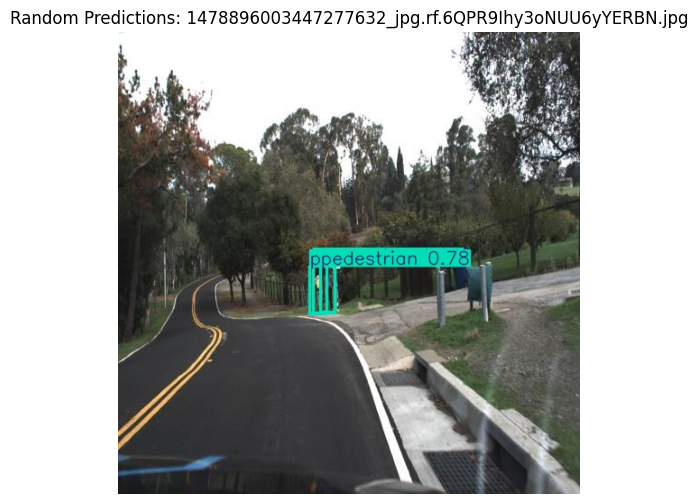

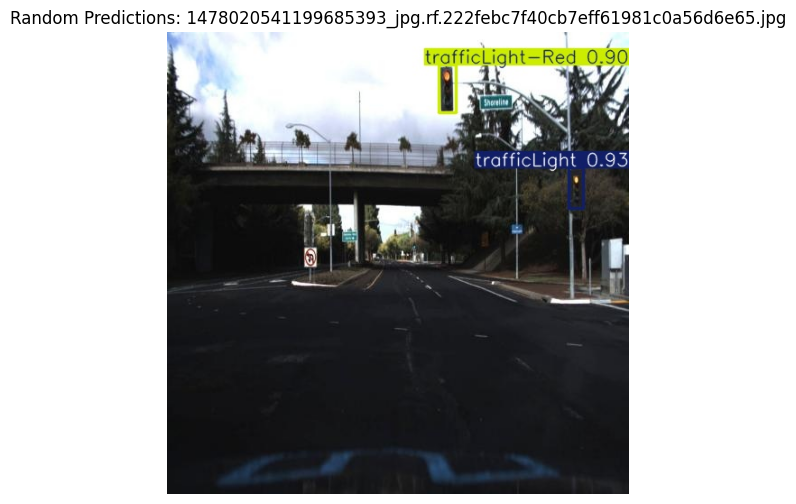

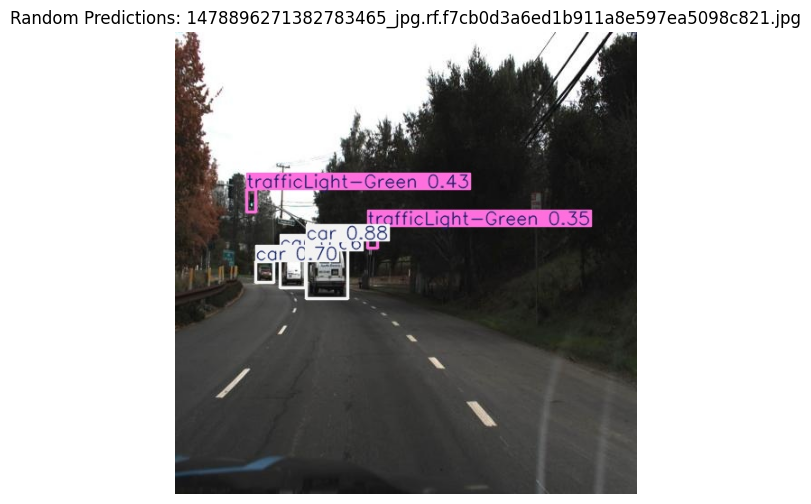

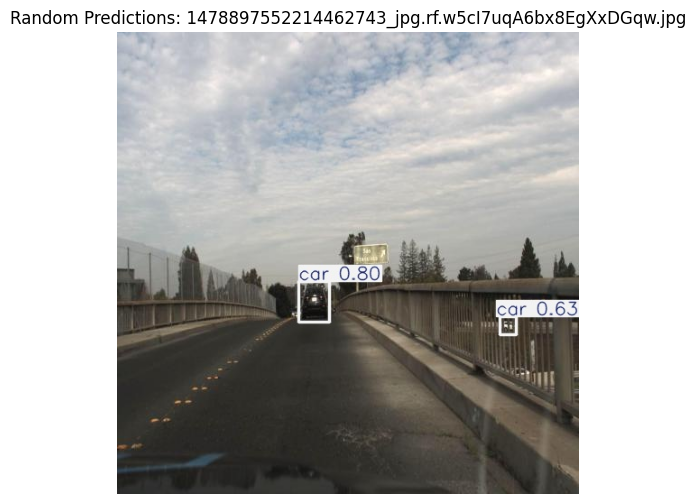

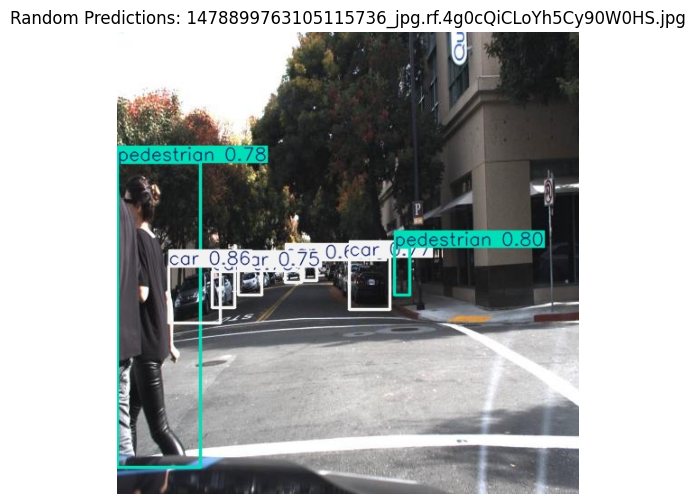

...

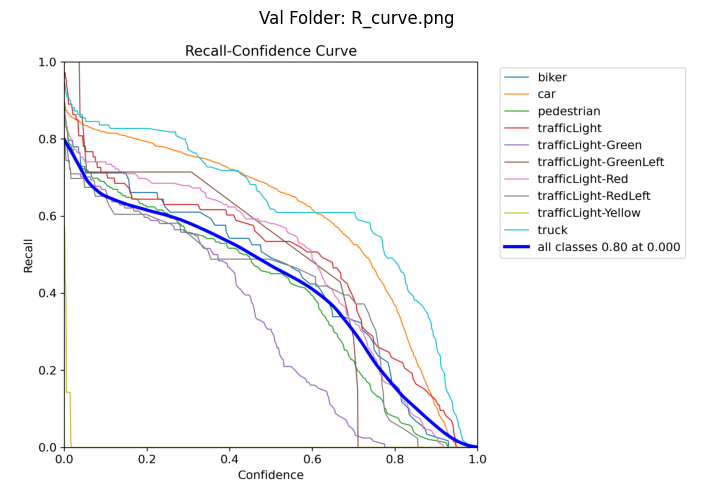

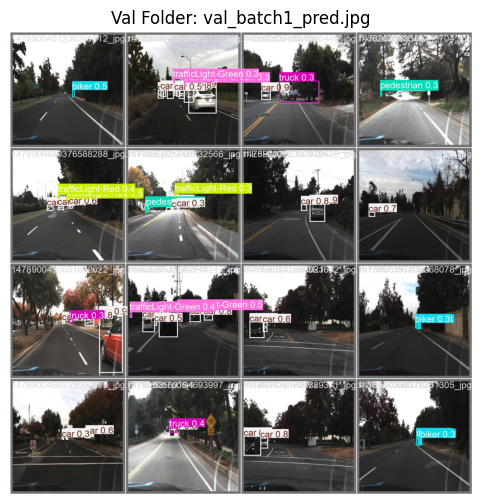

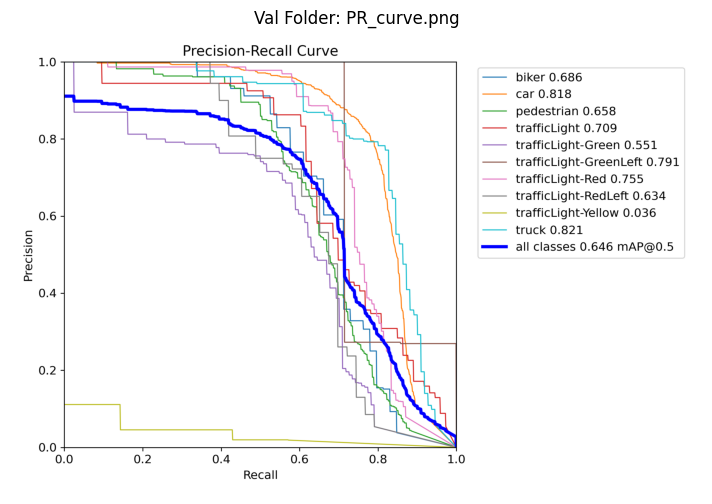

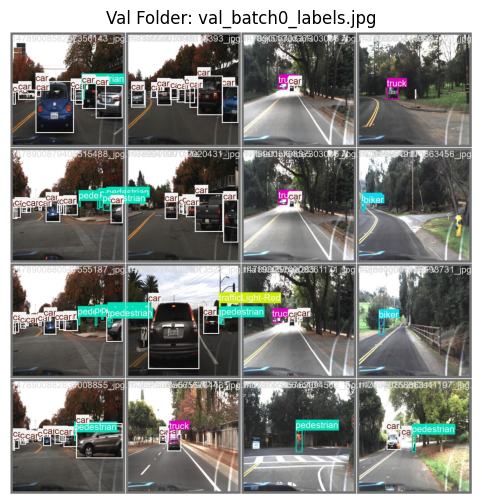

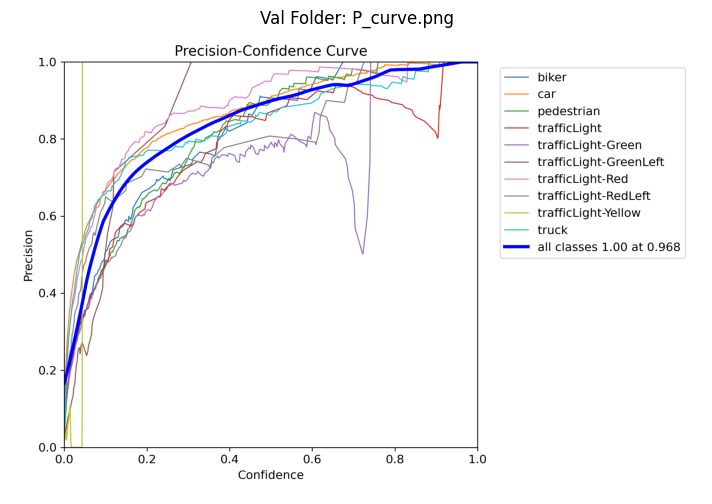

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def display_random_images(folder_path, title, num_images=40):
    if not os.path.exists(folder_path):
        print(f"Folder '{folder_path}' does not exist.")
        return

    # Get all image files
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    if not image_files:
        print(f"No images found in '{folder_path}'.")
        return

    # Select random subset if there are more images than requested
    if len(image_files) > num_images:
        image_files = random.sample(image_files, num_images)

    # Display each selected image
    for file in image_files:
        img_path = os.path.join(folder_path, file)
        img = Image.open(img_path)

        plt.figure(figsize=(10, 6))
        plt.imshow(img)
        plt.title(f"{title}: {file}")
        plt.axis('off')
        plt.show()

# Display 30 random images from predict2 folder
display_random_images('/content/runs/detect/predict2', 'Random Predictions', 30)

display_random_images('/content/runs/detect/val3', 'Val Folder')

# **EXPORT MODEL**

In [ ]:
import os

model_path = 'yolov8-training/exp_augmented_50e/weights/best.pt'

if os.path.exists(model_path):
    print("✅ Model found:", model_path)
else:
    print("❌ Model NOT found:", model_path)

❌ Model NOT found: yolov8-training/exp_augmented_50e/weights/best.pt


In [ ]:
import os
import shutil
import zipfile

# Paths
model_path = '/content/yolov8-models/best.pt'
new_folder = 'yolov8-model'
zip_path = 'yolov8-model.zip'

# Check if the model exists
if os.path.exists(model_path):
    print("✅ Model found:", model_path)

    # Create the new folder if it doesn't exist
    if not os.path.exists(new_folder):
        os.makedirs(new_folder)

    # Move the model to the new folder
    new_model_path = os.path.join(new_folder, 'best.pt')
    shutil.move(model_path, new_model_path)
    print(f"✅ Model moved to: {new_model_path}")

    # Zip the new folder
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(new_folder):
            for file in files:
                zipf.write(os.path.join(root, file), os.path.relpath(os.path.join(root, file), new_folder))
    print(f"✅ Folder zipped to: {zip_path}")
else:
    print("❌ Model NOT found:", model_path)


✅ Model found: /content/yolov8-models/best.pt
✅ Model moved to: yolov8-model/best.pt
✅ Folder zipped to: yolov8-model.zip


In [ ]:

# Download the existing zip file
from google.colab import files
files.download('/content/yolov8-model.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>